# The Winningest Methods in Competition (M4)
Reported by: Charls Chua

# Flow of Discussion:
##    I.) Background of M4
##    II.) Datasets
##    III.) Benchmarks
##    III.) Accuracy Measures
##    IV.) Performance of Submissions
##    V.) Top Performers
##    VI.) 7 Major Findings
##    VII.) Implementation of ESRNN using class dataset

# 

# BACKGROUND OF M4 FORECASTING COMPETITION

# M4 FORECASTING COMPETITION
###        Started: November 2017
###        Ended: May 31, 2018
# Aim:
Replicate and extend the three previous competition by:
    <br> a.) Significantly increasing the number of series
    <br> b.) Expand the number of forecasting methods
    <br> c.) Include prediction intervals in the evaluation process as well as point forecasts.

# Also introduced in M4:
    i.) More data 
    ii.) Emphasis on the reproducibility of the results
    iii.) Incorporation of a vast number of diverse series and benchmarks

#  

# DATASET

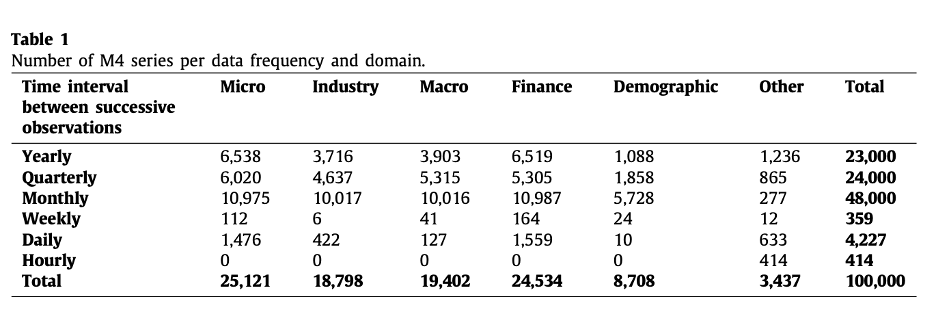

In [74]:
from IPython.display import Image
Image(filename='table1.png', width="1500")

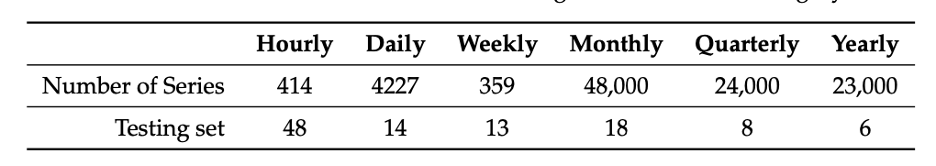

In [51]:
Image(filename='2testing.png', width="1200")

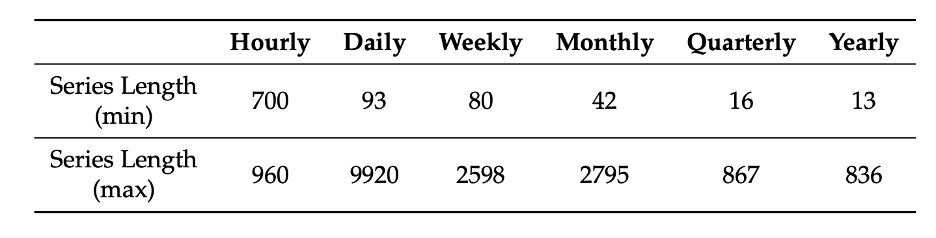

In [52]:
Image(filename='2serieslengthstat.png', width="1200")

#  

In [19]:
## Loading from the various library for data visualization
import os
import numpy as np
from matplotlib import pyplot
import pandas as pd
from pandas.plotting import autocorrelation_plot
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression ,BayesianRidge
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.svm import LinearSVR
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from math import sqrt
from sklearn.neural_network import MLPRegressor
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Embedding
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN
from tensorflow.keras.optimizers import RMSprop
from keras import backend as ker
import tensorflow as tf
os.chdir('/home/phd/cachua/ATSA/data')
os.getcwd()

'/home/phd/cachua/ATSA/data'

We will first look into some sample time series data from each category:
<br> We will begin with the first 50 timeseries data set for the hourly train data

Dimension:   (960, 414) 


 Visualisation of 50 first Series:


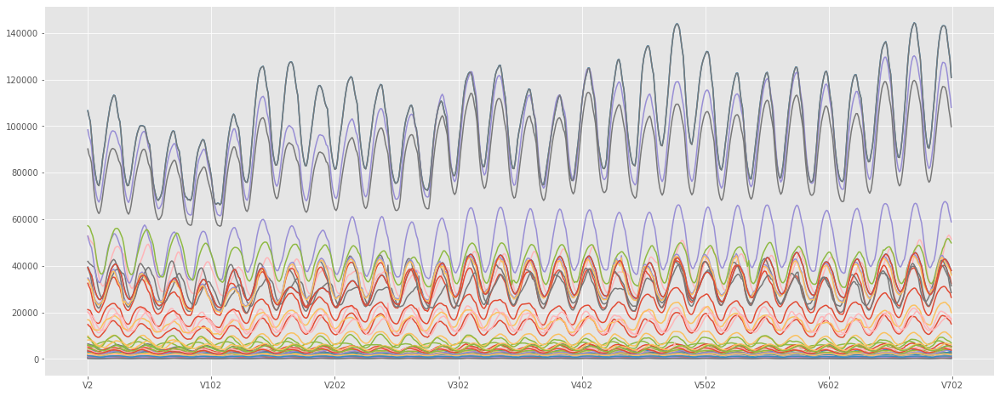

In [20]:
## Loading Dataset Hourly-train
os.chdir('/home/phd/cachua/ATSA/data')
os.getcwd()
df_hourly = pd.read_csv("Hourly-train.csv", skiprows=0, index_col =0)

hourly_train_Other = df_hourly

Dataset_hourly = hourly_train_Other.T.iloc[:,:]
print ("Dimension:  ",Dataset_hourly.shape,"\n")

## The following are visualized hourly data
print("\n","Visualisation of 50 first Series:" )
Sub_Dataset = Dataset_hourly.iloc[:,0:50]
Sub_Dataset.plot(figsize=(20, 8), legend = None)
#Sub_Dataset.plot.density()
pyplot.show()

Dimension:   (9919, 4227) 


 Visualisation of 50 first Series:


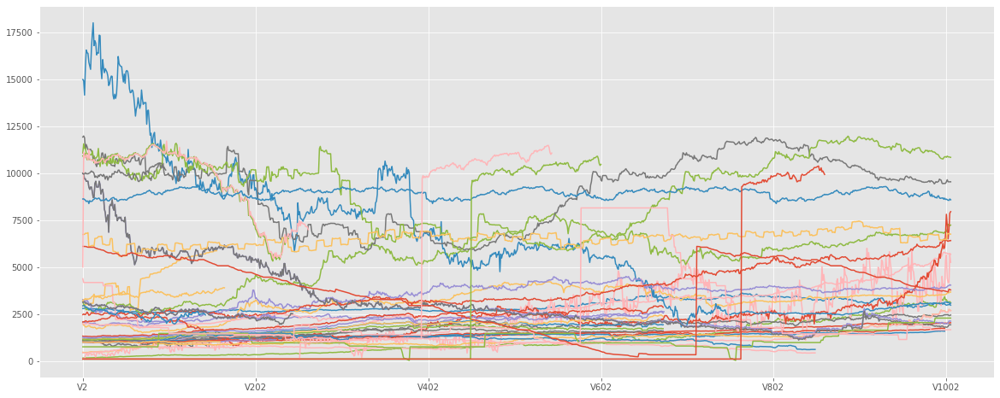

In [21]:
## Loading Dataset Daily-train
df_daily = pd.read_csv("Daily-train.csv", skiprows=0, index_col =0)

daily_train_Finance = df_daily[2035:3594].T
daily_train_Other = df_daily[3594:4227].T
daily_train_Industry = df_daily[1613:2035].T
daily_train_Demographic = df_daily[1603:1613].T
daily_train_Micro = df_daily[127:1603].T
daily_train_Macro = df_daily[:127].T

Dataset_daily = df_daily.T.iloc[:,:]
print ("Dimension:  ",Dataset_daily.shape,"\n")

## The following are visualized daily data
print("\n","Visualisation of 50 first Series:" )
Sub_Dataset = Dataset_daily.iloc[:,0:50]
Sub_Dataset.plot(figsize=(20, 8), legend = None)
#Sub_Dataset.plot.density()
pyplot.show()

Dimension:   (2597, 359) 


 Visualisation of 50 first Series:


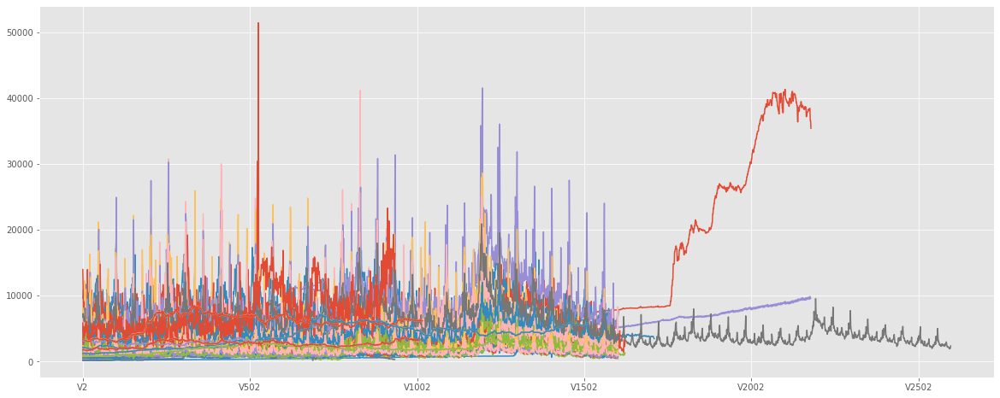

In [22]:
## Loading Dataset Weekly-train
df_weekly = pd.read_csv("Weekly-train.csv", skiprows=0, index_col =0)

Weekly_train = df_weekly
Weekly_train_Finance = df_weekly[59:223].T.iloc[:,:]
Weekly_train_Other = df_weekly[:12].T.iloc[:,:]
Weekly_train_Industry = df_weekly[53:59].T.iloc[:,:]
Weekly_train_Demographic = df_weekly[223:247].T.iloc[:,:]
Weekly_train_Micro = df_weekly[247:359].T.iloc[:,:]
Weekly_train_Macro = df_weekly[12:53].T.iloc[:,:]

Dataset_weekly = Weekly_train.T.iloc[:,:]
print ("Dimension:  ",Dataset_weekly.shape,"\n")

## The following are visualized weekly data
print("\n","Visualisation of 50 first Series:" )
Sub_Dataset = Dataset_weekly.iloc[:,0:50]
Sub_Dataset.plot(figsize=(20, 8), legend = None)
#Sub_Dataset.plot.density()
pyplot.show()

Dimension:   (2794, 48000) 


 Visualisation of 50 first Series:


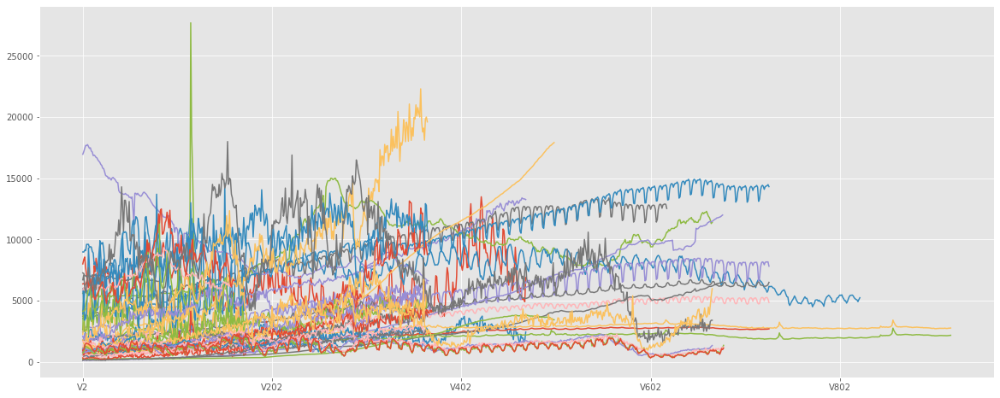

In [23]:
## Loading Dataset monthly-train
df_monthly = pd.read_csv("Monthly-train.csv", skiprows=0, index_col =0)

monthly_train_Finance = df_monthly[36736:47723].T
monthly_train_Other = df_monthly[47723:48000].T
monthly_train_Industry = df_monthly[26719:36736].T
monthly_train_Demographic = df_monthly[20991:26719].T
monthly_train_Micro = df_monthly[10016:20991].T
monthly_train_Macro = df_monthly[:10016].T

Dataset_monthly = df_monthly.T.iloc[:,:]
print ("Dimension:  ",Dataset_monthly.shape,"\n")

## The following are visualized monthly data
print("\n","Visualisation of 50 first Series:" )
Sub_Dataset = Dataset_monthly.iloc[:,0:50]
Sub_Dataset.plot(figsize=(20, 8), legend = None)
#Sub_Dataset.plot.density()
pyplot.show()



Dimension:   (866, 24000) 


 Visualisation of 50 first Series:


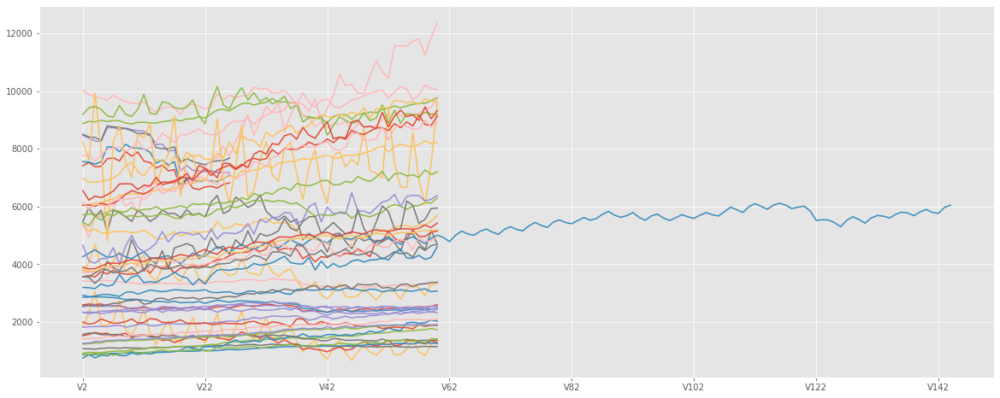

In [24]:
## Loading Dataset Quarterly-train
df_quaterly = pd.read_csv("Quarterly-train.csv", skiprows=0, index_col =0)

quaterly_train_Finance = df_quaterly[17830:23135].T
quaterly_train_Other = df_quaterly[23135:24000].T
quaterly_train_Industry = df_quaterly[13193:17830].T
quaterly_train_Demographic = df_quaterly[11335:13193].T
quaterly_train_Micro = df_quaterly[5315:11335].T
quaterly_train_Macro = df_quaterly[:5315].T

Dataset_quaterly = df_quaterly.T.iloc[:,:]
print ("Dimension:  ",Dataset_quaterly.shape,"\n")

## The following are visualized quarterly data
print("\n","Visualisation of 50 first Series:" )
Sub_Dataset = Dataset_quaterly.iloc[:,0:50]
Sub_Dataset.plot(figsize=(20, 8), legend = None)
#Sub_Dataset.plot.density()
pyplot.show()



Dimension:   (835, 23000) 


 Visualisation of 50 first Series:


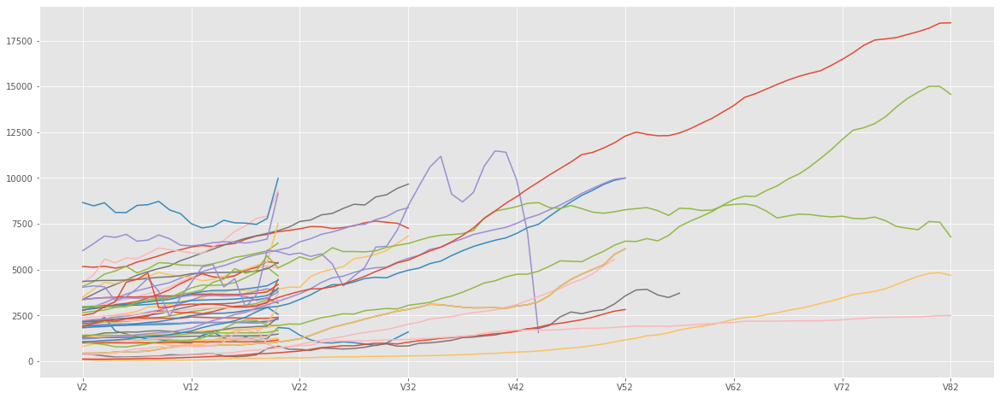

In [25]:
## Loading Dataset Yearly-train
df_yearly = pd.read_csv("Yearly-train.csv", skiprows=0, index_col =0)

yearly_train_Finance = df_yearly[15245:21764].T
yearly_train_Other = df_yearly[21764:23000].T
yearly_train_Industry = df_yearly[11529:15245].T
yearly_train_Demographic = df_yearly[10441:11529].T
yearly_train_Micro = df_yearly[3903:10441].T
yearly_train_Macro = df_yearly[:3903].T

Dataset_yearly = df_yearly.T
print ("Dimension:  ",Dataset_yearly.shape,"\n")

## The following are visualized yearly data
print("\n","Visualisation of 50 first Series:" )
Sub_Dataset = Dataset_yearly.iloc[:,0:50]
Sub_Dataset.plot(figsize=(20, 8), legend = None)
#Sub_Dataset.plot.density()
pyplot.show()

# BENCHMARKS

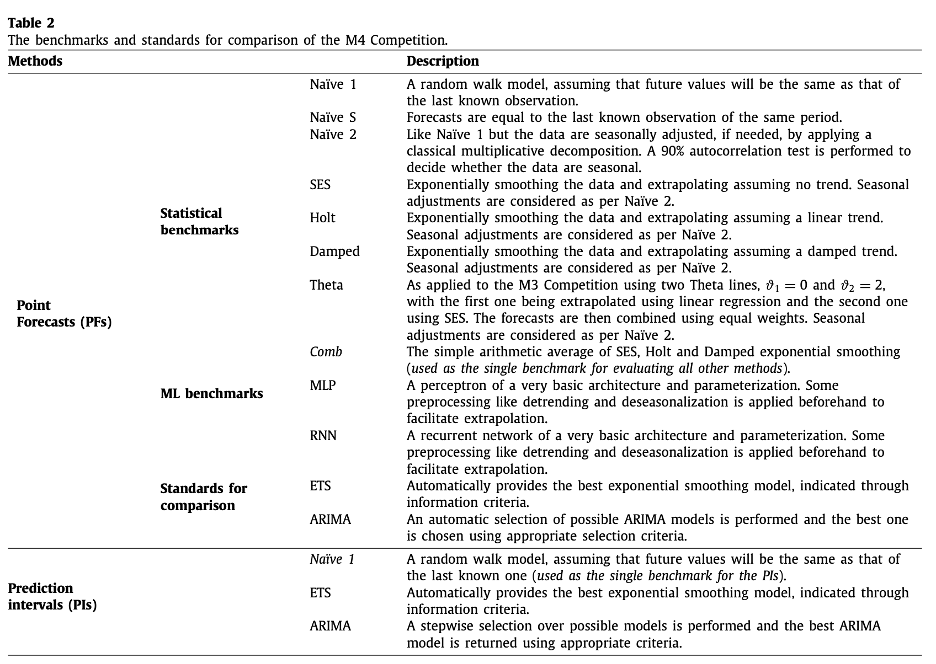

In [15]:
Image(filename='table2.png', width = "1700") 

#  

# ACCURACY MEASURES:

## Peformance Measure for Point Forecast (PFs)

- measure of single point estimates of its expected value

### symmetric Mean Absolute Percentage Error (sMAPE; Makridakis, 1993) 

<br> - is an accuracy measure based on percentage (or relative) errors. 
<br> - Relative error is the absolute error divided by the magnitude of the exact value. 
<br> - In contrast to the mean absolute percentage error, SMAPE has both a lower bound and an upper bound. 
<br> - is percentage-based, it's scale-independent, which means that it can be used to compare forecast performances between datasets. 
<br> - limitation to SMAPE is that if the actual value or forecast value is 0, the value of error will approach 100%. 
<br> - The lower the SMAPE value of a forecast, the higher its accuracy. 

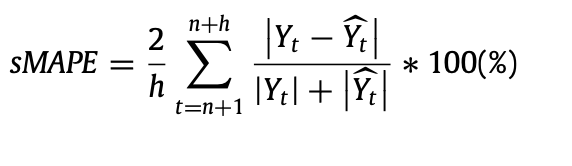

In [13]:
Image(filename='sMAPE.png') 

### Mean Absolute Scaled Error (MASE; Hyndman & Koehler, 2006)

<br> - Is the mean absolute error of the forecast values, divided by the mean absolute error of the naive forecast, where the naive forecast uses a previous value or an average of several previous points. 
<br> - is a scale-free error metric. 
<b4> - You can use MASE to compare forecast methods on a single series and also to compare forecast accuracy between series.
<br> - is a very good metric to use unless all of the historical observations are equal. 
<br> - If they're equal the observations display a straight line and the MASE result would be infinite or undefined.

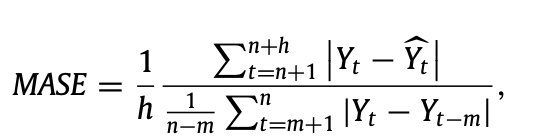

In [77]:
Image(filename='MASE.png', width="600") 

Where:
    <br> Yt is the value of the time series at point t
    <br> Ŷt is the estimated forecast
    <br> h is the forecast horizon
    <br> n is the number of data points available in the sample
    <br> m is the time interval between successive observations considered by the organizers for each data frequency
    <br>    i.e. (12 for monthly, 4 for quarterly, 24 for hourly, 1 for yearly, 1 for daily data)

# OWA (Overall weighted average)

OWA of sMAPE and MASE is calculated by first dividing their total value by the corresponding value of Naïve 2 to obtain the relative sMAPE and the relative MASE, respectively, and then computing their simple arithmetic mean.

Example:
    if Method X displays a MASE of 1.6 and 
    an sMAPE of 12.5% across the 100,000 series of M4, 
    
    while Naïve 2 displays a MASE of 1.9 and an sMAPE of 13.7%, 
    
    the relative MASE of Method X would be equal to 1.6/1.9 = 0.84 
    and the relative and sMAPE for method X would be equal to 12.5/13.7 = 0.91,
    
    resulting in an OWA of (0.84 + 0.91)/2 = 0.88, 
    
    which indicates that, on average, the method examined is about 12% more accurate than Naïve 2, 

## Peformance Measures for Prediction Intervals (PIs)


- used to provide a range where the forecast is likely to be with a specific degree of confidence. 

<br> For example, if you made 100 forecasts with 95% confidence, you would have 95 out of 100 forecasts fall within the prediction interval.

### Mean Scaled Interval Score (MSIS) of Gneiting and Raftery (2007)

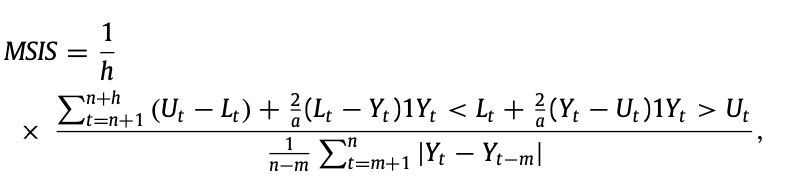

In [9]:
Image(filename='MSIS.png', width="1000") 

where:
    <br> Lt is the lower bound of the prediction interval
    <br> Ut is the upper bound of the prediction interval
    <br> Yt are the future observations of the series
    <br> a is the significance level
    <br> 1 is the indicator function 
    <br>    (being 1 if Yt is within the postulated interval and 0 otherwise).
    <br>    Since the forecasters were asked to generate 95% prediciton intervals, a is set to 0.05

#  

# BENCHMARK ACCURACIES

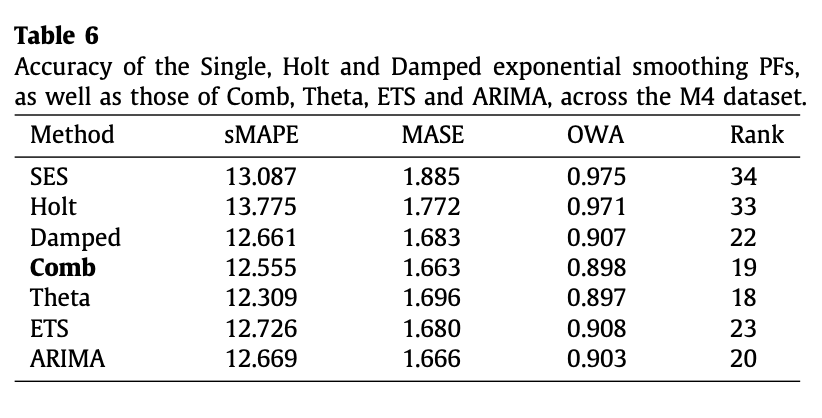

In [16]:
Image(filename='table6.png', width="2000") 

# PERFORMANCE OF SUBMISSIONS

## There were 248 participants who were registered to participate in the M4 Competition

### Only 49 individuals/teams submitted valid PFs for all 100,000 time series. 
<br> 10 benchmarks
<br> 2 standards for comparison

### Only 20 forecasters providing valid PIs for all 100,000 alongside their PFs. 
<br> 1 benchmark
<br> 2 standards for comparison

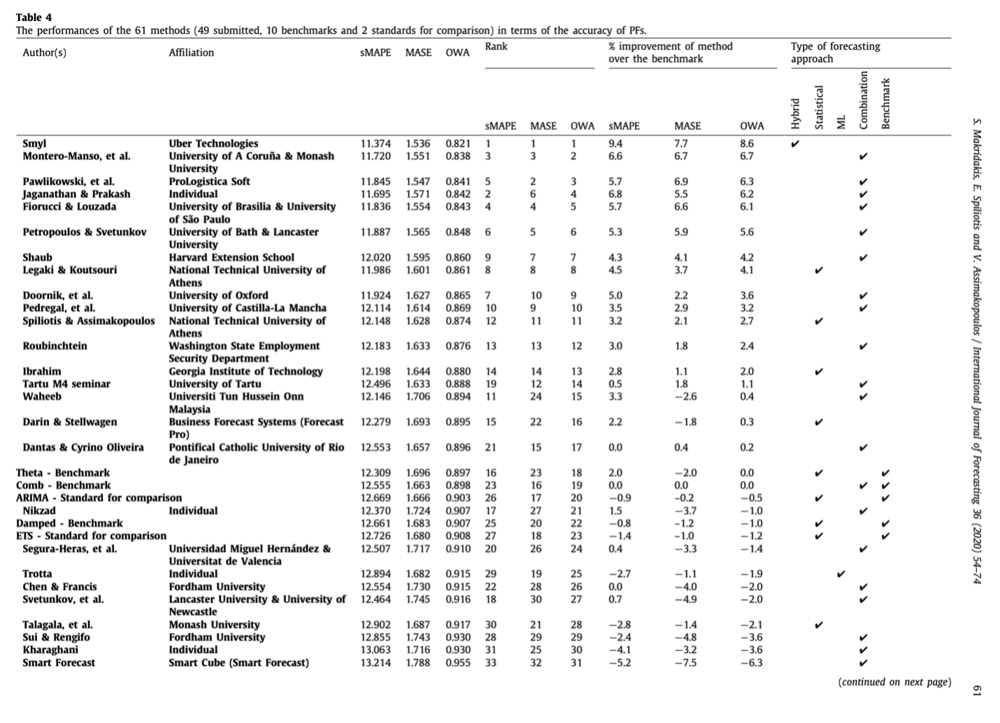

In [19]:
Image(filename='table4.png', width="1800") 

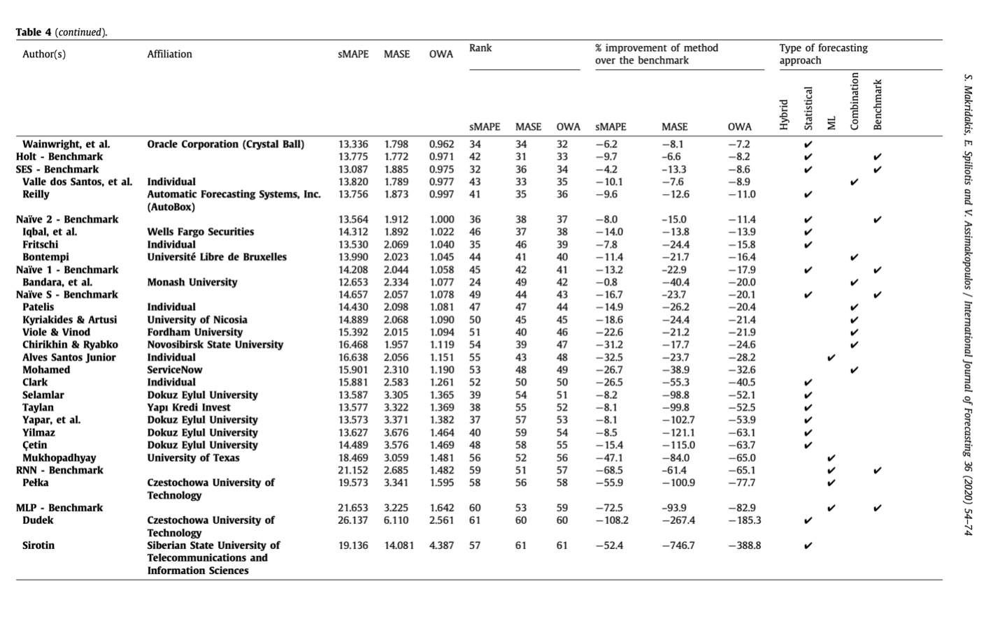

In [20]:
Image(filename='table4cont.png', width="1800") 

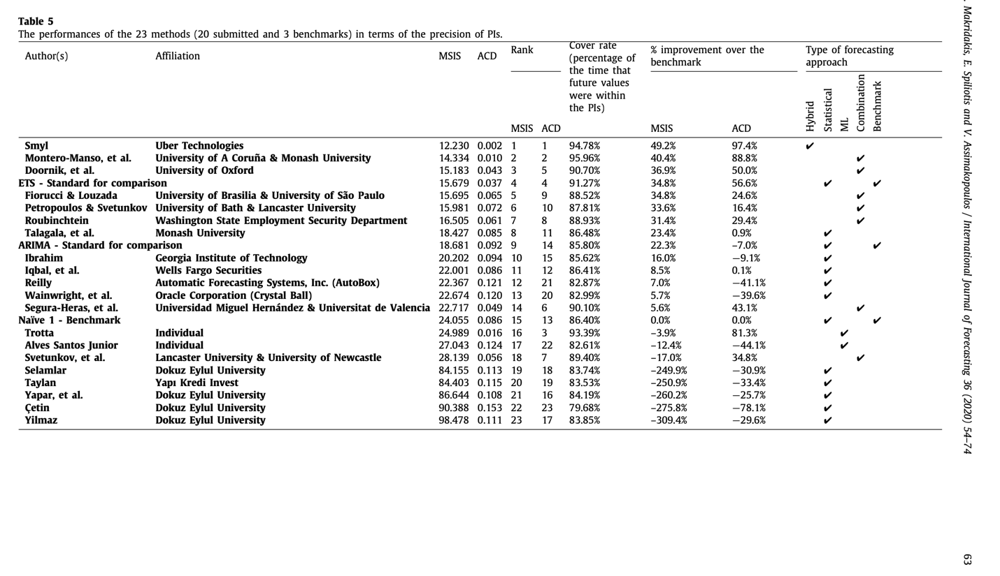

In [21]:
Image(filename='table5.png', width="1800") 

# Winner: Smyl Slawek
### Paper: A hybrid method of exponential smoothing and recurrent neural networks for time series forecasting

Method used: ESRNN (Exponential Smoothing - Recurrent Neural Network)
using advanced LSTM (Long Short Term Memory) neural network

The ES equations enables the method to effectviely capture the main components of the individual series such as seasonality and level

While the LSTM networks allow non-linear trend and cross-learning

Hybrid forecasting approach has the following three main elements:
   <br> i. Deseasonalization and adoptive normalization (ES)
       <br> a. no time stamp made it difficult to detect seasonality patterns
   <br> ii. Generation of forecasts
   <br> iii. Ensembling

In [18]:
from ESRNN import ESRNN
from ESRNN.m4_data import *
from ESRNN.utils_evaluation import evaluate_prediction_owa
from ESRNN.utils_visualization import plot_grid_prediction

In [97]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Hourly", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=414)

In [98]:
# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[24, 168], input_size=24, output_size=48,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')

In [99]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)

Infered frequency: H
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 28.6199
Training loss (50 prc): 0.70241
========= Epoch 1 finished =========
Training time: 28.06138
Training loss (50 prc): 0.59290
========= Epoch 2 finished =========
Training time: 22.8347
Training loss (50 prc): 0.53480
========= Epoch 3 finished =========
Training time: 22.69861
Training loss (50 prc): 0.49681
========= Epoch 4 finished =========
Training time: 26.52718
Training loss (50 prc): 0.46950
Train finished! 



In [100]:
# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=24)

===============  Model evaluation  ==============
OWA: 0.985 
SMAPE: 15.617 
MASE: 2.684 


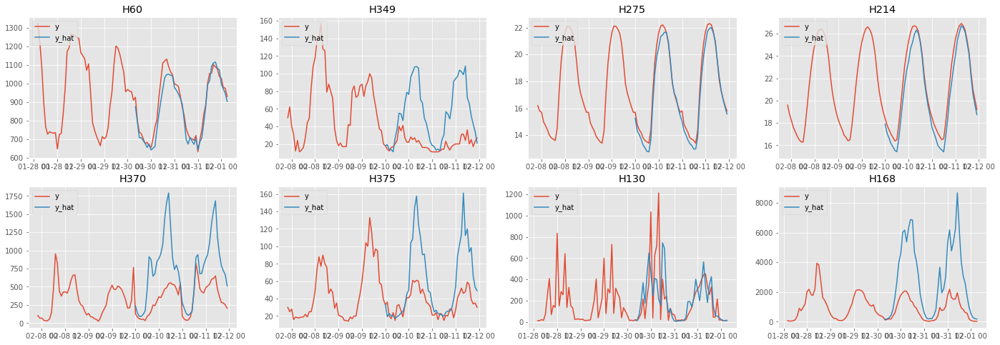

In [101]:
unique_ids = ['H214', 'H60', 'H275', 'H375', 
              'H349', 'H130', 'H370', 'H168']

plot_preds = pd.concat([y_train_df.groupby('unique_id').tail(50), 
                        y_test_df], 
                       sort=True)
plot_grid_prediction(plot_preds, y_hat_df, 
                     unique_ids=unique_ids)

In [6]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Daily", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=4227)

# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[7, 168], input_size=7, output_size=14,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')


In [7]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)

Infered frequency: D
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 50.73154
Training loss (50 prc): 0.02638
========= Epoch 1 finished =========
Training time: 58.63291
Training loss (50 prc): 0.47966
========= Epoch 2 finished =========
Training time: 47.4837
Training loss (50 prc): 0.56448
========= Epoch 3 finished =========
Training time: 45.99119
Training loss (50 prc): 0.34046
========= Epoch 4 finished =========
Training time: 55.10887
Training loss (50 prc): 0.24113
Train finished! 



===============  Model evaluation  ==============
OWA: 2.207 
SMAPE: 6.214 
MASE: 1.445 


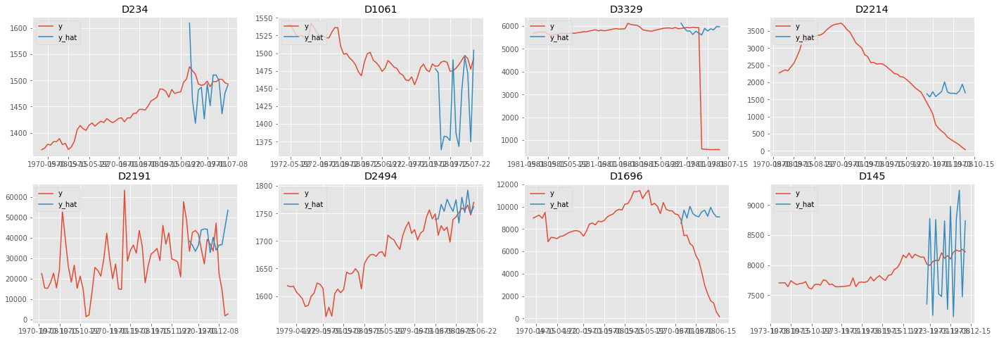

In [8]:
# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=24)

unique_ids = ['D145', 'D234', 'D2494', 'D1061', 
              'D1696', 'D2214', 'D3329', 'D2191']

plot_preds = pd.concat([y_train_df.groupby('unique_id').tail(50), 
                        y_test_df], 
                       sort=True)
plot_grid_prediction(plot_preds, y_hat_df, 
                     unique_ids=unique_ids)

In [113]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Weekly", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=359)

# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[52, 364], input_size=52, output_size=13,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')



In [114]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)



Infered frequency: W-SUN
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 1.31927
Training loss (50 prc): 0.27385
========= Epoch 1 finished =========
Training time: 1.52013
Training loss (50 prc): 0.25833
========= Epoch 2 finished =========
Training time: 1.33064
Training loss (50 prc): 0.13176
========= Epoch 3 finished =========
Training time: 1.34146
Training loss (50 prc): 0.08941
========= Epoch 4 finished =========
Training time: 2.34772
Training loss (50 prc): 0.07074
Train finished! 



===============  Model evaluation  ==============
OWA: 1.361 
SMAPE: 10.411 
MASE: 0.917 


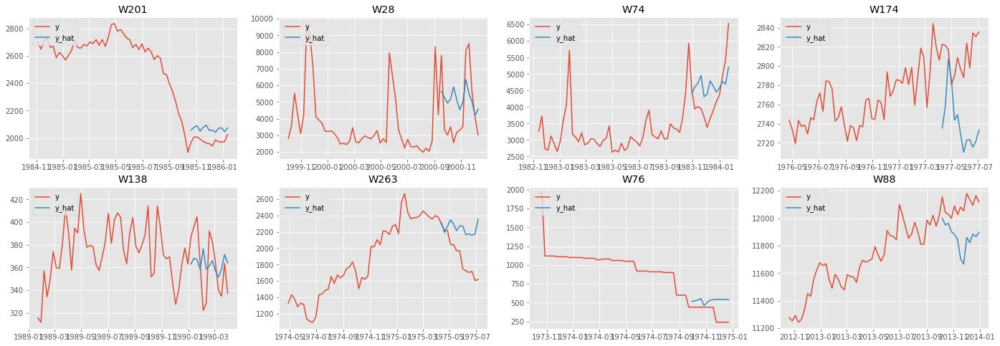

In [115]:
# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=24)

unique_ids = ['W201', 'W138', 'W88', 'W174', 
              'W28', 'W263', 'W76', 'W74']

plot_preds = pd.concat([y_train_df.groupby('unique_id').tail(50), 
                        y_test_df], 
                       sort=True)
plot_grid_prediction(plot_preds, y_hat_df, 
                     unique_ids=unique_ids)

In [12]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Monthly", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=48000)

# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[12, 168], input_size=12, output_size=18,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')



In [13]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)



Infered frequency: M
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 260.52761
Training loss (50 prc): 0.76877
========= Epoch 1 finished =========
Training time: 342.31954
Training loss (50 prc): 3.86134
========= Epoch 2 finished =========
Training time: 287.89652
Training loss (50 prc): 2.53283
========= Epoch 3 finished =========
Training time: 298.66441
Training loss (50 prc): 1.23554
========= Epoch 4 finished =========
Training time: 283.16428
Training loss (50 prc): 0.93709
Train finished! 



===============  Model evaluation  ==============
OWA: 1.76 
SMAPE: 18.374 
MASE: 1.68 


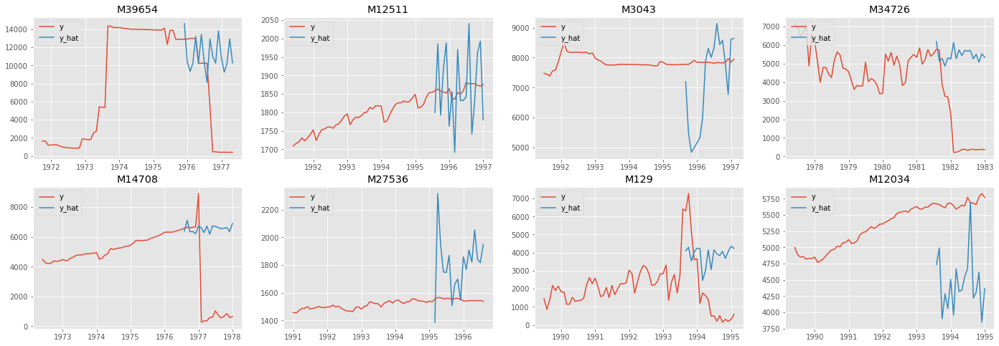

In [14]:
# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=24)

unique_ids = ['M12511', 'M27536', 'M3043', 'M12034', 
              'M39654', 'M34726', 'M129', 'M14708']

plot_preds = pd.concat([y_train_df.groupby('unique_id').tail(50), 
                        y_test_df], 
                       sort=True)
plot_grid_prediction(plot_preds, y_hat_df, 
                     unique_ids=unique_ids)

In [15]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Quarterly", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=24000)

# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[4, 168], input_size=4, output_size=8,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')



In [16]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)



Infered frequency: Q-DEC
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 83.11486
Training loss (50 prc): 0.60373
========= Epoch 1 finished =========
Training time: 101.23033
Training loss (50 prc): 2.78582
========= Epoch 2 finished =========
Training time: 94.14609
Training loss (50 prc): 1.99722
========= Epoch 3 finished =========
Training time: 97.44452
Training loss (50 prc): 1.12404
========= Epoch 4 finished =========
Training time: 94.45486
Training loss (50 prc): 0.83320
Train finished! 



/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


===============  Model evaluation  ==============
OWA: nan 
SMAPE: 15.509 
MASE: nan 


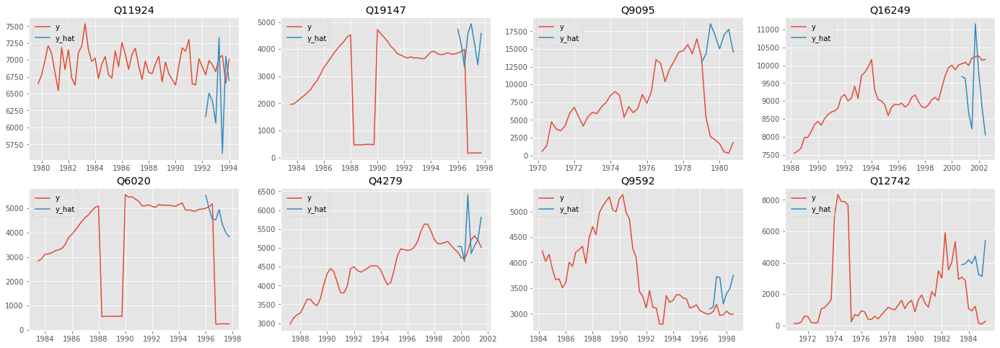

In [17]:
# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=24)

unique_ids = ['Q9592', 'Q11924', 'Q4279', 'Q16249', 
              'Q9095', 'Q19147', 'Q6020', 'Q12742']

plot_preds = pd.concat([y_train_df.groupby('unique_id').tail(50), 
                        y_test_df], 
                       sort=True)
plot_grid_prediction(plot_preds, y_hat_df, 
                     unique_ids=unique_ids)



Preparing Yearly dataset
Preparing Naive2 Yearly dataset predictions


/home/phd/cachua/.local/lib/python3.9/site-packages/ESRNN/m4_data.py:182: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  y_naive2_df = y_naive2_df.append(y_naive2)
/home/phd/cachua/.local/lib/python3.9/site-packages/ESRNN/m4_data.py:182: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  y_naive2_df = y_naive2_df.append(y_naive2)
/home/phd/cachua/.local/lib/python3.9/site-packages/ESRNN/m4_data.py:182: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  y_naive2_df = y_naive2_df.append(y_naive2)
/home/phd/cachua/.local/lib/python3.9/site-packages/ESRNN/m4_data.py:182: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  y_naive2_df = y_naive2_df.append(y_

Infered frequency: D
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 67.06315
Training loss (50 prc): 0.53253
========= Epoch 1 finished =========
Training time: 75.89593
Training loss (50 prc): 2.21394
========= Epoch 2 finished =========
Training time: 74.43801
Training loss (50 prc): 1.77831
========= Epoch 3 finished =========
Training time: 64.52934
Training loss (50 prc): 0.76815
========= Epoch 4 finished =========
Training time: 62.01755
Training loss (50 prc): 0.51053
Train finished! 



/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


===============  Model evaluation  ==============
OWA: nan 
SMAPE: 17.581 
MASE: nan 


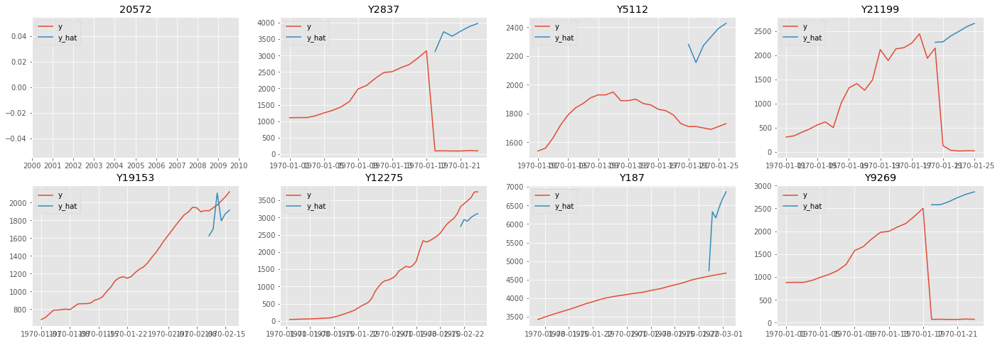

In [18]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Yearly", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=23000)

# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[1, 168], input_size=4, output_size=6,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')

# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)

# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=24)

unique_ids = ['Y19153', 'Y12275', 'Y5112', 'Y187', 
              'Y21199', 'Y2837', 'Y9269', '20572']

plot_preds = pd.concat([y_train_df.groupby('unique_id').tail(50), 
                        y_test_df], 
                       sort=True)
plot_grid_prediction(plot_preds, y_hat_df, 
                     unique_ids=unique_ids)

### What did not work well?
The method generated accurate forecasts for most of the frequencies and especially for the monthly, yearly and quarterly ones. 
<br>
<br> However, the accuracy was sub-optimal for the case of the hourly, daily and weekly data. 
<br> 
<br> This is partly explainable by the author’s concentration on the ”three big” subsets: monthly, yearly and quarterly, as they covered 95% of the data, and performing well on them was key to success in the Competition.
<br>
<br> However, subsequent work on hourly, daily and weekly data confirmed that the under-performance is a real problem. 

#  

# 1st Runner up: Montero-Manzo, et. al
### Paper: FFORMA: Feature-based Forecast Model Averaging (M4metalearning)

The model Combines nine different well-known forecasting algorithms:

 1. **ARIMA** The ARIMA model. Parameters like the order of differencing, *p*, *q* are obtained through an exhaustive search.
   The code for fitting the model is `forecast::auto.arima(x, stepwise=FALSE, approximation=FALSE)`
   
 2. **ETS** Exponential smoothing state space model with parameters fitted automatically. The code for fitting the model is`forecast::ets(x)`
 
 3. **NNETAR** A feed-forward neural network with a single hidden layer is fitted to the lags. The number of lags is automatically selected.  The code for fitting the model is `forecast::nnetar(x)`
 
 4. **TBATS** The Exponential smoothing state space Trigonometric, Box-Cox transformation, ARMA errors, Trend and Seasonal components model. Parameters like the application of a Box-Cox transformation, to include trend, etc. are automatically fitted. The code for fitting the model is `forecast::tbats(x)`
 
 5. **STLM-AR** Seasonal and Trend decomposition using Loess with AR modeling of the seasonally adjusted series. The code for fitting the model is `forecast::stlm(x, modelfunction = stats::ar)`
 
 6. **RW-DRIFT** Random Walk with Drift. The code for fitting the model is `forecast::rwf(x, drift=TRUE)`
 7. **THETAF** The theta method of Assimakopoulos and Nikolopoulos (2000).
 The code for fitting the model is `forecast::thetaf(x)`
 
 8. **NAIVE** The naive method, using the last observation  of the series as the forecasts. The code for fitting the model is `forecast::naive(x)`
 
 9. **SEASONAL NAIVE** The forecast are the last observed value of the same season. The code for fitting the model is `forecast::snaive(x)`


# TOP PERFORMING SUBMISSIONS

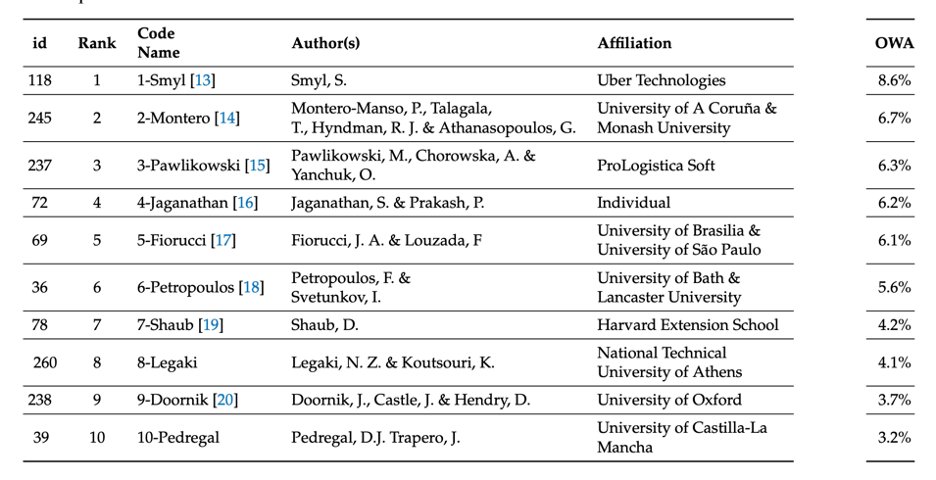

In [53]:
Image(filename='2top10perf.png', width="1200") 

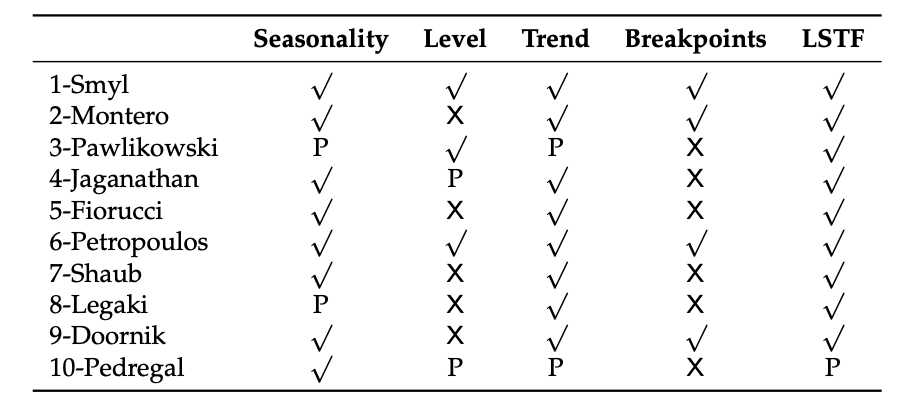

In [54]:
Image(filename='2forecastingattributes.png', width="1200") 

# PERFORMANCE EVALUATION

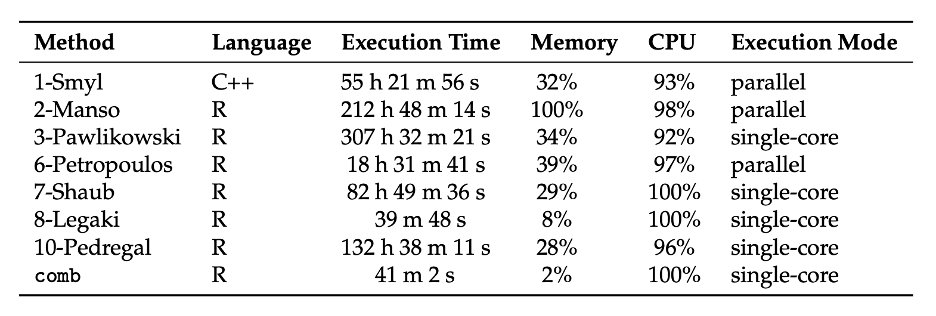

In [86]:
Image(filename='2performanceevaluation.png', width="2000")

# M COMPETITION OUTPUT

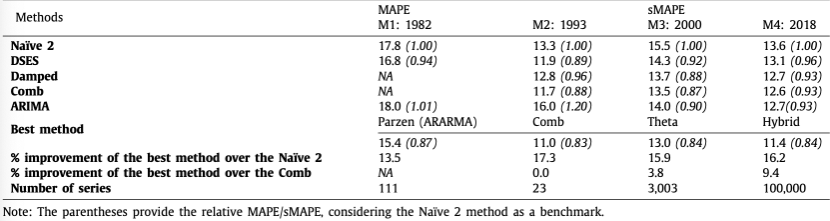

In [102]:
Image(filename='table8updated.png', width="2000") 

# CONCLUSION

# 7 MAJOR FINDINGS OF THE M4 COMPETITION:
    1. The improved numerical accuracy of combining
    2. The superiority of hybrid approach that utlizes both statistical and ML features
    3. The Significant differences between the six top-performing methods and the rest in therms of PFs.
    4. The improved precision of the PIs
    5. More complex methods can possibly lead to a greater forecasting accuracy
    6. Using information from multiple series to predict individual ones
    7. Poor performance of the submitted pure ML methods.

## 1. The improved numerical accuracy of combining

## 2. The superiority of a hybrid appoach that utilizes both statistical and ML features

## 3. The Significant Differences between the six top-performing methods and the rest in terms of PFs.

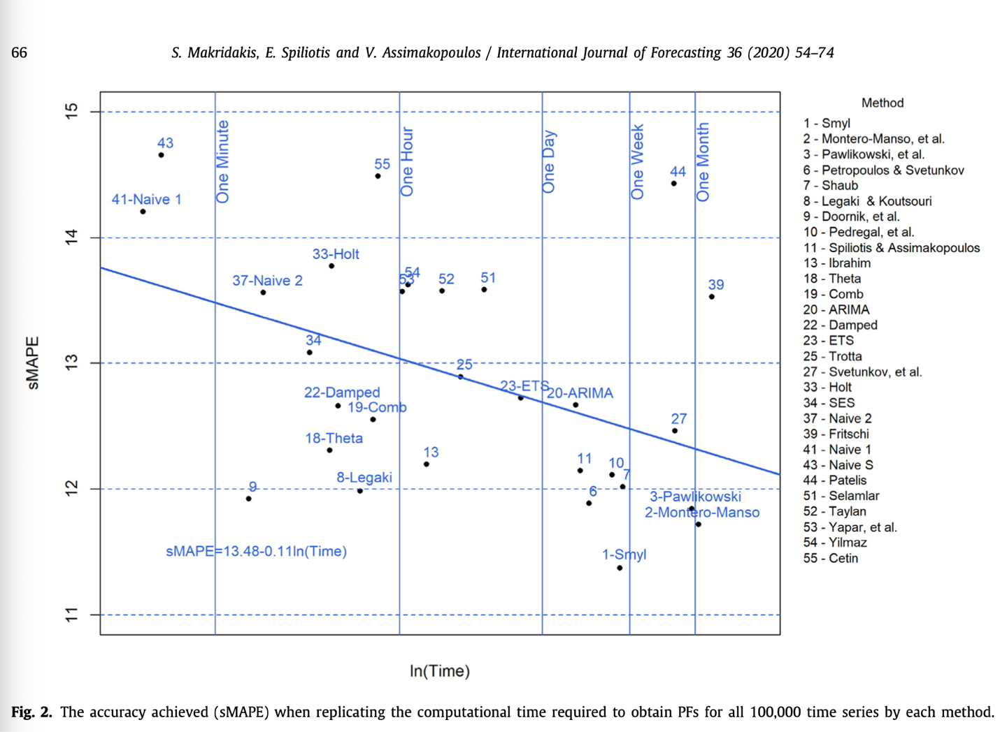

In [14]:
Image(filename='figure2.png') 

## 4. The Improved precision of PIs

## 5. More complex methods can possibly lead to a greater forecasting accuracy

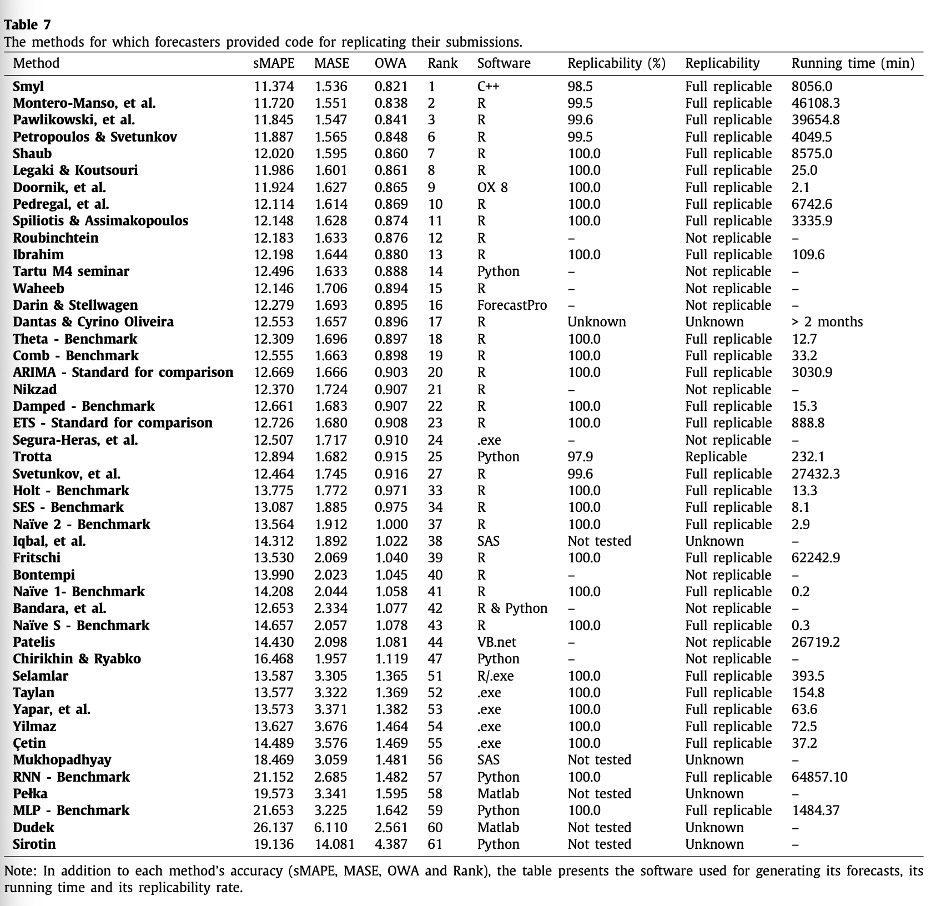

In [27]:
Image(filename='table7.png', width="1200") 

## 6. Using information from multiple series to predict individual ones.

For the first time, the top three performing methods of the M4, as measured by PFs, introduced information from multiple series (aggregated by data frequency) in order to decide on the most effective way of forecasting and/or selecting the weights for combining the various statistical/ML methods considered. 

It must be investigated whether such information was part of the reason why these three methods managed to perform better that the remaining ones, and if so, to what extent. 


## 7. The poor performance of the submitted pure ML methods

A total of five ML methods (four pure and one combination) were submitted in M4. All of them were less accurate than the Comb benchmark in terms of PFs, and only one was more accurate than the Naïve 2 method. 

# VII.) Implementation of ESRNN using class dataset


In [117]:
# Load modules
import os
import warnings
import numpy as np
import pandas as pd
from pandas import DataFrame
from pandas import concat
from math import sqrt
from pandas import Series
import matplotlib.pyplot as plt
import plotly.express as px
import pylab as plot
import plotly.offline as pyoff
import plotly.tools as tools
from plotly.graph_objs import *
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly.figure_factory as ff
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.tsa.api as smtsa
import statsmodels.api as sm
from statsmodels.tsa.stattools import kpss, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

pyoff.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")
%matplotlib inline

In [118]:
# Constant Helpers
# From MDalangin

# For Plotting
STYLE = 'ggplot'
plt.style.use(STYLE)
FIGSIZE = (14, 7)
FIGDPI = 180

# Taken from Prof. Felix's Univariate Time Series Notebook
REGRESSION = "c"
AUTOLAG = "AIC"
NLAGS = "auto"

# Differencing Names
ORIGINAL_NAME = 'Original'
FIRST_DIFF_NAME = '1st Order'
SECOND_DIFF_NAME = '2nd Order'

# “Life, the universe, and everything”!
SEED = 42

# Change working Directory
# os.chdir('./data')

# For Modeling
SPLIT = 0.80

In [119]:
#From MDalangin
class UniTS_Toolbox:

    def preprocess_dataset(self, csv_path):
        """Perform preprocessing of the dataset
        Parameters
        ----------
        csv_path (string)
        - path of the dataset

        Output
        ----------
        Time series data 
        """

        df = pd.read_csv(csv_path,
                         sep=';',
                         parse_dates={'dt': ['Date', 'Time']},
                         infer_datetime_format=True,
                         low_memory=False,
                         na_values=['nan', '?'],
                         index_col='dt')
        df.columns = [x.lower() for x in df.columns]

        # features
        relevant_columns = [
            "global_active_power", "global_reactive_power", "voltage",
            "global_intensity", "sub_metering_1", "sub_metering_2",
            "sub_metering_3"
        ]

        # Handling missing values
        for every_column in relevant_columns:
            df[every_column] = df[every_column].interpolate()

        # Computation for overall power consumtion
        eq1 = (df['global_active_power'] * 1000 / 60)
        eq2 = df['sub_metering_1'] + \
            df['sub_metering_2'] + df['sub_metering_3']
        df['power_consumption'] = eq1 - eq2
        relevant_columns = df.columns

        # Aggregating level: "M" - Monthly, "W" - Weekly, "D" - Daily
        df = df[relevant_columns].resample('D').sum()
        df_power_consumption = df['power_consumption']

        return df_power_consumption
    
    def plot_it(self,
                x1=None,
                y1=None,
                x2=None,
                y2=None,
                x3=None,
                y3=None,
                x_title=None,
                y_title=None,
                title=None,
                t1_name=None,
                t2_name=None,
                t3_name=None,
                mode=None):
        """Plot Graphs using Plotly
        Parameters
        ----------
        x1 {float}
            - trace 1 numbers to be plotted in x
        y1 {float}
            - trace 1 numbers to be plotted in y
        x2 {float}
            - trace 2 numbers to be plotted in x
        y2 {float}
            - trace 2 numbers to be plotted in y
        x3 {float}
            - trace 3 numbers to be plotted in x
        y3 {float}
            - trace 3 numbers to be plotted in y
        x_title {string}(default: None)
            - label in x-axis
        y_title {string}(default: None)
            - label in y-axis
        title (string)(default: None)
            - plot title
        t1_name (string)(default: None)
            - trace 1 title
        t2_name (string)(default: None)
            - trace 2 title
        t3_name (string)(default: None)
            - trace 3 title
        mode (string)(default: None)
            - type of the marker
        """
        trace1 = go.Scatter(x=x1,
                            y=y1,
                            mode=mode,
                            marker=dict(size=12,
                                        color='royalblue',
                                        line=dict(width=3,
                                                  color='rgba(0, 0, 0, 1.0)')),
                            name=t1_name)
        trace2 = go.Scatter(x=x2,
                            y=y2,
                            mode=mode,
                            marker=dict(size=12,
                                        color='firebrick',
                                        line=dict(width=3,
                                                  color='rgba(0, 0, 0, 1.0)')),
                            name=t2_name)
        trace3 = go.Scatter(x=x3,
                            y=y3,
                            mode=mode,
                            marker=dict(size=12,
                                        color='green',
                                        line=dict(width=3,
                                                  color='rgba(0, 0, 0, 1.0)')),
                            name=t3_name)
        layout = go.Layout(xaxis=dict(showgrid=True,
                                      title=x_title,
                                      titlefont=dict(size=15),
                                      tickfont=dict(size=15)),
                           yaxis=dict(showgrid=True,
                                      title=y_title,
                                      titlefont=dict(size=15),
                                      tickfont=dict(size=15)),
                           title=title,
                           titlefont=dict(size=20),
                           template='ggplot2')
        fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
        pyoff.iplot(fig)

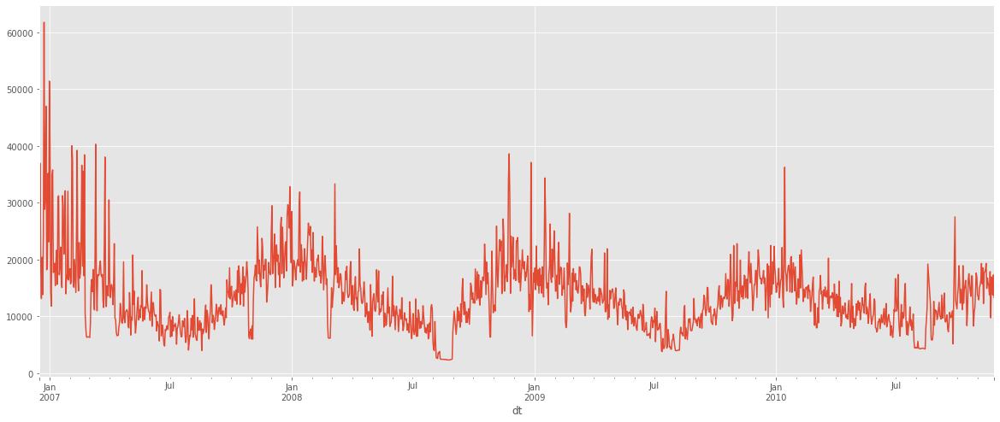

In [41]:
#From MDalangin
df_power_consumption.astype(int).plot(figsize=(20, 8))
#Sub_Dataset.plot.density()
pyplot.show()

In [45]:
df_power_consumption.to_csv('household_power_consumption-train.csv')

In [59]:
#From MDalangin
ts = UniTS_Toolbox()
# Dataset from https://www.kaggle.com/datasets/uciml/electric-power-consumption-data-set?
#select=household_power_consumption.txt
# Aggregating level: "D" - Daily
os.chdir('/home/phd/cachua/ATSA/data')
os.getcwd()
D = "household_power_consumption.txt"
df_power_consumption_daily = ts.preprocess_dataset(D)
ts_data_daily = df_power_consumption_daily

## Implementation of ESRNN to class dataset (Daily)

In [109]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Daily", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=4227)

In [110]:

# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[7, 168], input_size=7, output_size=14,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')



In [111]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)

# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=7)



Infered frequency: D
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 60.58347
Training loss (50 prc): 0.02673
========= Epoch 1 finished =========
Training time: 59.61972
Training loss (50 prc): 0.47833
========= Epoch 2 finished =========
Training time: 59.01439
Training loss (50 prc): 0.55942
========= Epoch 3 finished =========
Training time: 55.85418
Training loss (50 prc): 0.34409
========= Epoch 4 finished =========
Training time: 60.33612
Training loss (50 prc): 0.24253
Train finished! 

===============  Model evaluation  ==============
OWA: 19.514 
SMAPE: 56.192 
MASE: 44.432 


## Implementation of ESRNN to class dataset (Weekly)

In [103]:
X_train_df, y_train_df, X_test_df, y_test_df = prepare_m4_data(
   dataset_name="Weekly", 
   directory="/home/phd/cachua/ATSA/esrnn_torch-master/data", 
   num_obs=359)

In [104]:
# Instantiate model
model = ESRNN(max_epochs=5, freq_of_test=1, batch_size=32, 
              learning_rate=0.02, per_series_lr_multip=0.5,
              lr_scheduler_step_size=7, lr_decay=0.5, 
              gradient_clipping_threshold=50, 
              rnn_weight_decay=0.0, noise_std=0.001, 
              level_variability_penalty=30, 
              testing_percentile=50, training_percentile=50,
              ensemble=True, max_periods=371, 
              seasonality=[52, 364], input_size=52, output_size=13,
              cell_type='LSTM', state_hsize=40, 
              dilations=[[1, 4, 24, 168]], add_nl_layer=False,
              random_seed=1, device='cpu')

In [105]:
# Fit model
# If y_test_df is provided the model 
# will evaluate predictions on this 
# set every freq_test epochs
model.fit(X_train_df, y_train_df)



Infered frequency: W-SUN
=============== Training ESRNN  ===============

========= Epoch 0 finished =========
Training time: 1.47008
Training loss (50 prc): 0.28125
========= Epoch 1 finished =========
Training time: 1.48886
Training loss (50 prc): 0.26450
========= Epoch 2 finished =========
Training time: 1.37841
Training loss (50 prc): 0.13398
========= Epoch 3 finished =========
Training time: 1.30857
Training loss (50 prc): 0.08898
========= Epoch 4 finished =========
Training time: 1.67207
Training loss (50 prc): 0.09757
Train finished! 



In [106]:
# Predict on test set
y_hat_df = model.predict(X_test_df)

# Evaluate predictions
final_owa, final_mase, final_smape = evaluate_prediction_owa(y_hat_df, y_train_df, 
                                                             X_test_df, y_test_df,
                                                             naive2_seasonality=52)

===============  Model evaluation  ==============
OWA: 11.32 
SMAPE: 72.933 
MASE: 14.308 


# -END-

# References:
### The M4 Competition: 100,000 time series and 61 forecasting methods
- by Spyros Makridakis , Evangelos Spiliotis and Vassilios Assimakopoulos
- Code Source: https://github.com/Mcompetitions/M4-methods

### Reproducibility of the Top-Performing Methods in the M4 Competition
- by Maria Soleim, Odd Erik Gundersen

### A Multi-Factor Analysis of Forecasting Methods: A Study on the M4 Competition
- by Pantelis Agathangelou, Demetris Trihinas, Ioannis Katakis
- Code Source: https://github.com/unic-ailab/m4-multi-factor-analysis

### ESRNN GPU Code
- Code Source: https://github.com/kdgutier/esrnn_torch